# Week 1 Assignment


# Signal Representation and Sampling

1) Generate a sine wave of frequency 10 Hz with:
Duration = 2seconds and
Sampling rate = 500 Hz.

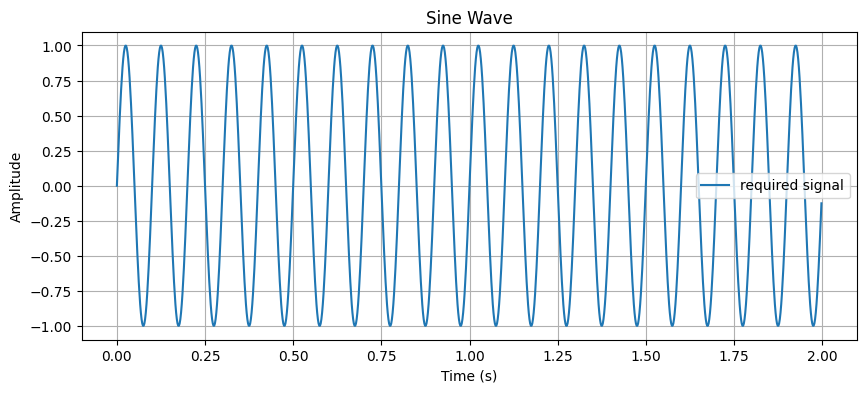

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

frequency = 10
duration = 2
sampling_rate = 500

time_continuous = np.linspace(0,duration,int(duration * sampling_rate),endpoint=False)
sine_wave = np.sin(2 * np.pi * frequency * time_continuous)

plt.figure(figsize=(10, 4))
plt.plot(time_continuous,sine_wave,label="required signal")
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.title('Sine Wave')
plt.grid(True)
plt.show()

2) Plot the continuous signal and a discretized version sampled at 40 Hz.

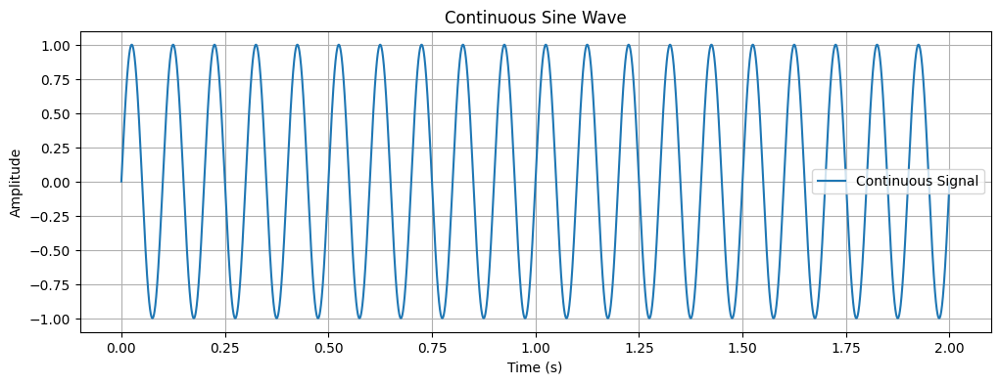

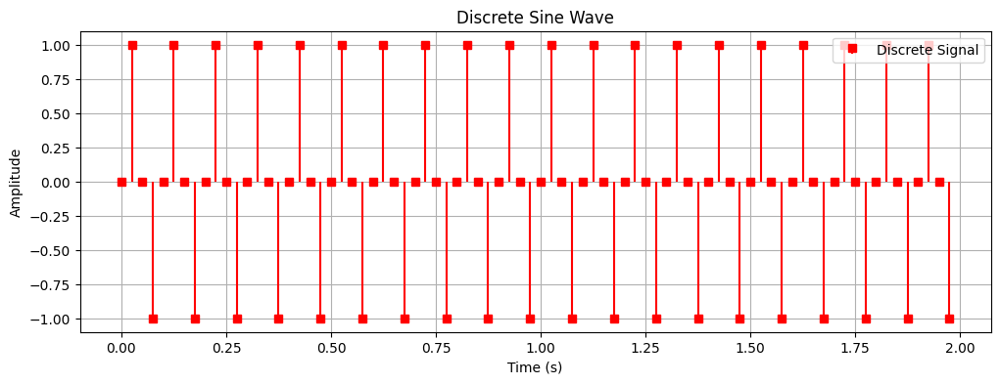

In [ ]:
frequency = 10
duration = 2
sampling_rate_con = 5000

#continuous
time_con = np.linspace(0, duration, int(sampling_rate_con * duration), endpoint=False)
sine_wave_con = np.sin(2 * np.pi * frequency * time_con)

#plot
plt.figure(figsize=(12, 4))
plt.plot(time_con, sine_wave_con, label="Continuous Signal")
plt.title("Continuous Sine Wave")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.legend()
plt.show()

#discrete
sampling_rate_dis= 40
time_dis = np.linspace(0, duration, int(sampling_rate_dis * duration), endpoint=False)
sine_wave_discrete = np.sin(2 * np.pi * frequency * time_dis)

#plot
plt.figure(figsize=(12, 4))
plt.stem(time_dis, sine_wave_discrete, linefmt='r-', markerfmt='rs', basefmt=" ", label="Discrete Signal")
plt.title("Discrete Sine Wave")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.legend()
plt.show()

3) Experiment: Vary the sampling rate (e.g., 20 Hz, 50 Hz, 100 Hz) and observe the effect on the discrete signal.


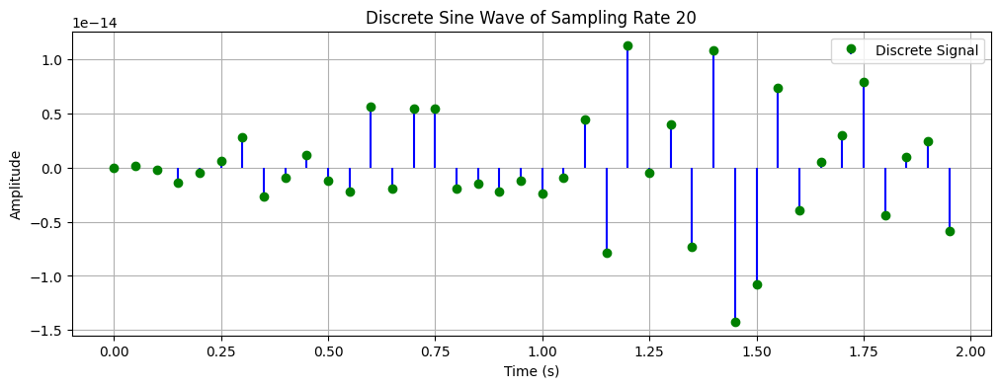

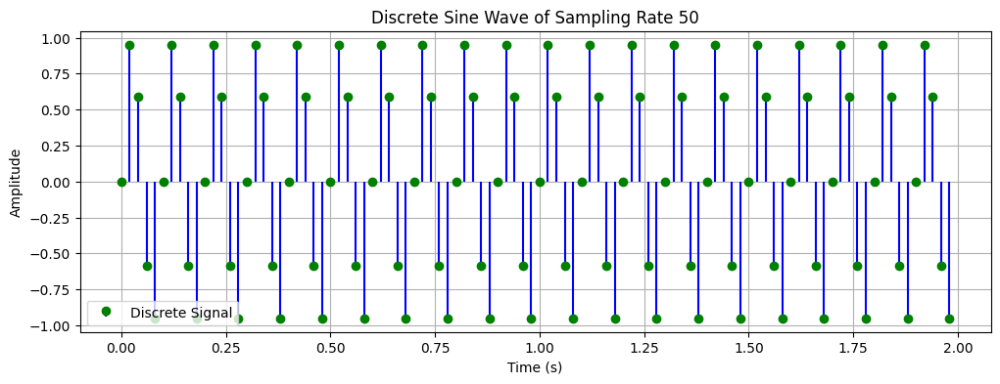

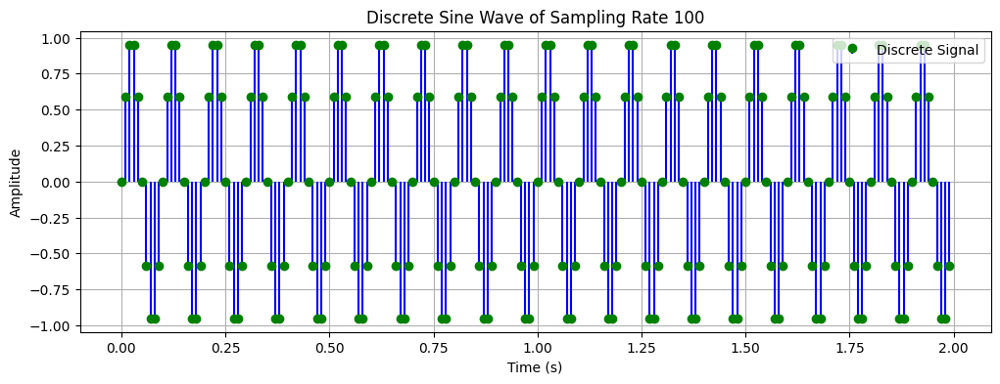

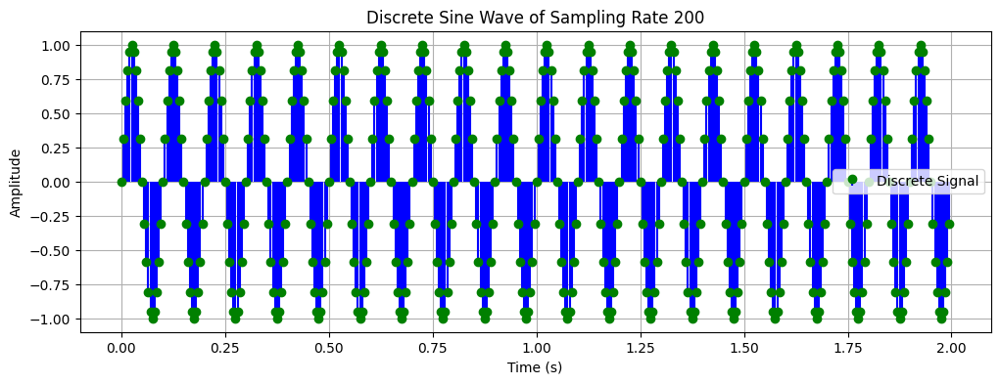

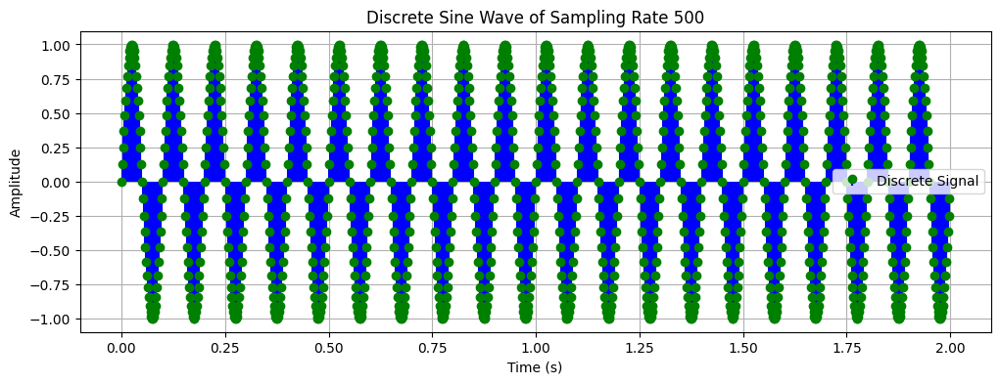

In [ ]:
sampling_rate= [20,50,100,200,500]

for sr in sampling_rate:
    time = np.linspace(0,duration,int(duration * sr),endpoint=False)
    sine_wave = np.sin(2 * np.pi * frequency * time)

    plt.figure(figsize=(12, 4))
    plt.stem(time, sine_wave, linefmt='b-', markerfmt='go', basefmt=" ", label="Discrete Signal")
    plt.title(f"Discrete Sine Wave of Sampling Rate {sr}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.legend()
    plt.show()



# Fourier Transform and Frequency Domain Analysis

1) Generate a composite signal by summing two sine waves with frequencies 5 Hz and 20 Hz.

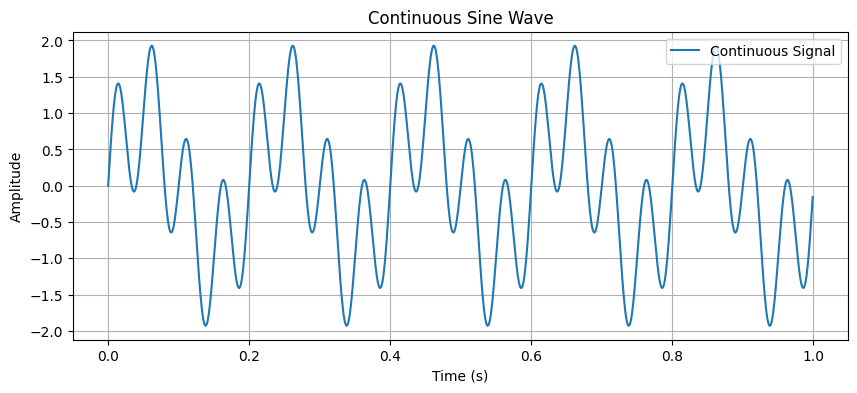

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
freq1=5
freq2=20
duration=1
sam_rate=1000
x_axis=np.linspace(0,duration,int(sam_rate*duration),endpoint=False)
y_axis=np.sin(2*(np.pi)*freq1*x_axis)+np.sin(2*(np.pi)*freq2*x_axis)
plt.figure(figsize=(10, 4))
plt.plot(x_axis,y_axis, label="Continuous Signal")
plt.title("Continuous Sine Wave")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.legend()
plt.show()

2) Perform the Fourier Transform (FT) on the composite signal,
plot the magnitude spectrum and identify the prominent frequency components.

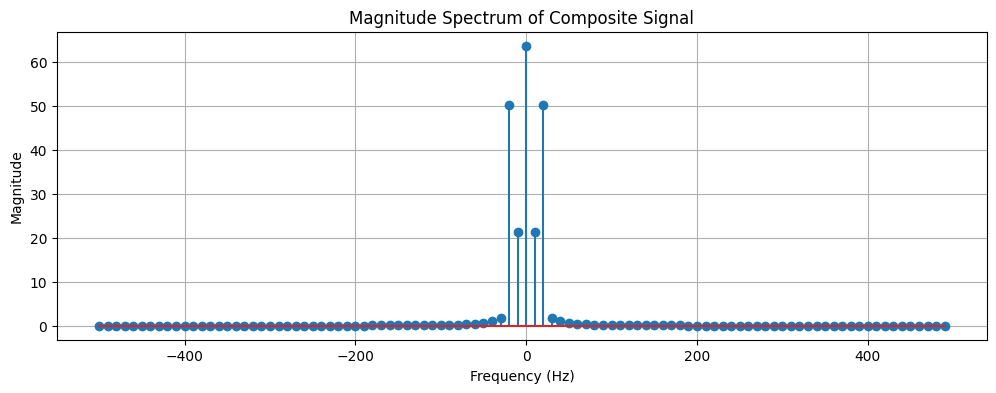

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

f1 = 5
f2 = 20
Dur = 0.1
Samprate = 1000

t = np.linspace(0, Dur, int(Samprate*Dur), endpoint=False)
comp_signal = np.sin(2 * np.pi * f1 * t) + np.sin(2 * np.pi * f2 * t)
freq = np.fft.fft(comp_signal)
magnitude = np.abs(freq)
freqval = np.fft.fftfreq(len(comp_signal), 1/Samprate)
plt.figure(figsize=(12, 4))
plt.stem(freqval, magnitude)
plt.title("Magnitude Spectrum of Composite Signal")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
plt.grid(True)
plt.show()

# Audio Signal Analysis

1) Upload like 5 audio but belonging to the same category, like animals, music instruments and stuff (e.g.wav or .mp3) and load it using librosa.

In [ ]:
!pip install librosa
from google.colab import files
import librosa
import librosa.display
import matplotlib.pyplot as plt

In [ ]:
audio_mp3 ={
    "/content/little-robot-sound-84657.mp3",
    "/content/run-11239.mp3",
    "/content/sample-9s.mp3",
    "/content/squeak-45410.mp3",
    "/content/tiger-attack-195840.mp3"
}

2) Plot the waveform of the audio signal.

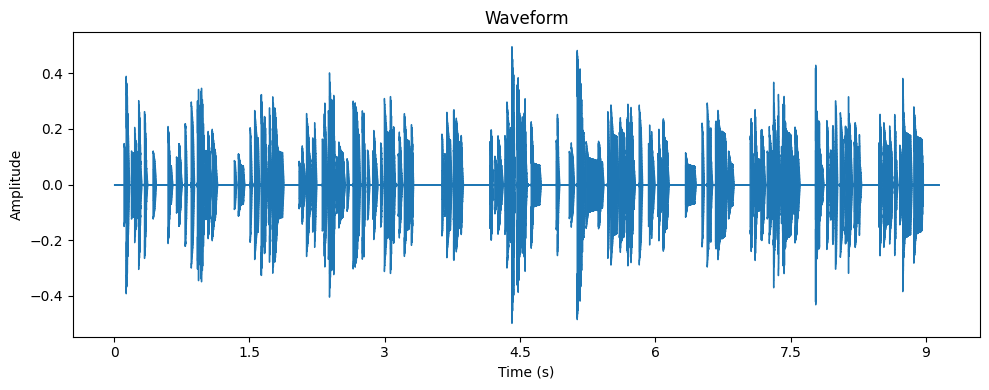

Audio data shape: (219456,)
Sample rate: 24000 Hz


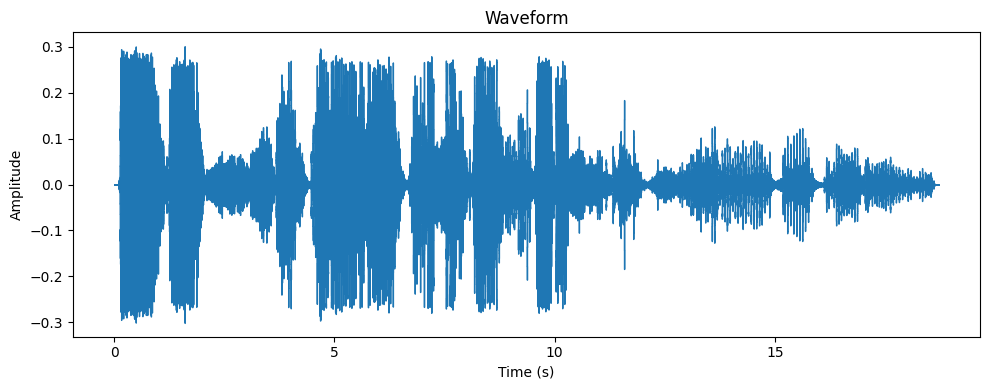

Audio data shape: (898560,)
Sample rate: 48000 Hz


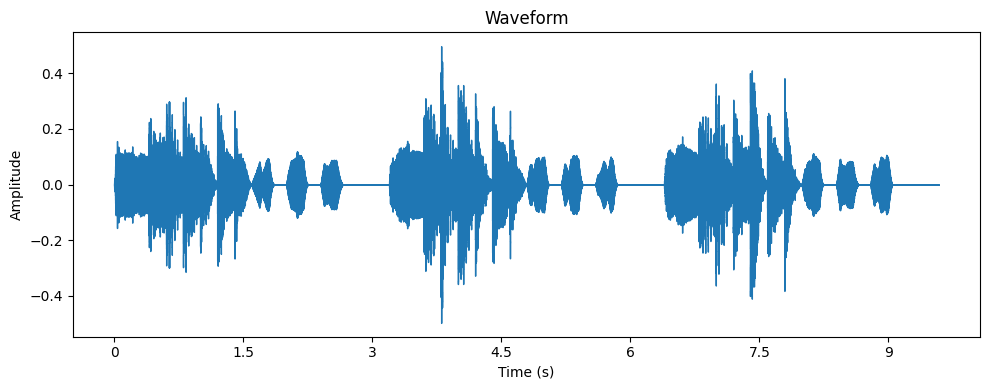

Audio data shape: (422784,)
Sample rate: 44100 Hz


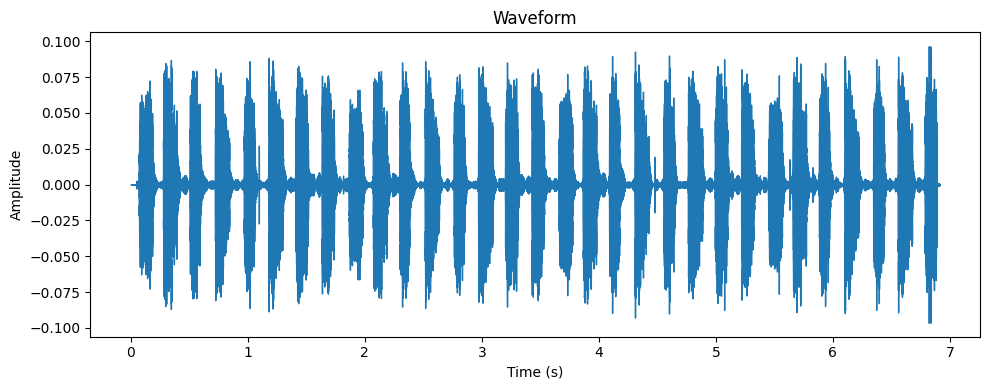

Audio data shape: (165888,)
Sample rate: 24000 Hz


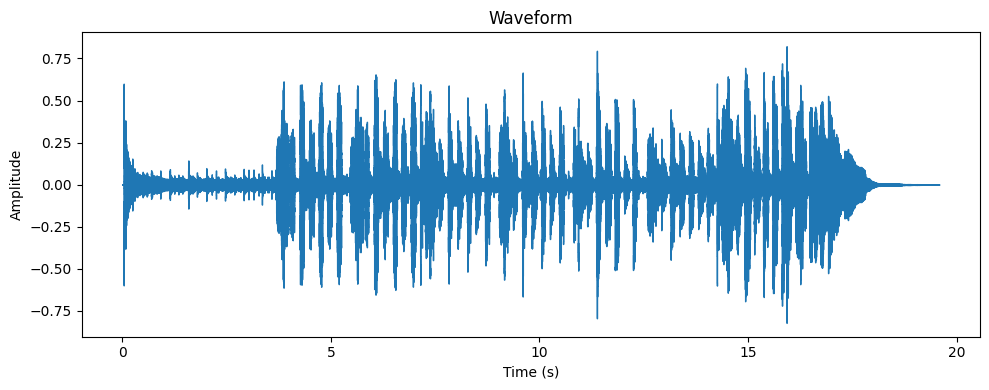

Audio data shape: (940032,)
Sample rate: 48000 Hz


In [ ]:
audio_list = []
sample_rate_list = []
for audio in audio_mp3:
  audio_data, sample_rate = librosa.load(audio, sr=None)
  audio_list.append(audio_data)
  sample_rate_list.append(sample_rate)
  plt.figure(figsize=(10, 4))
  librosa.display.waveshow(audio_data, sr=sample_rate)
  plt.title("Waveform")
  plt.xlabel("Time (s)")
  plt.ylabel("Amplitude")
  plt.tight_layout()
  plt.show()
  print(f"Audio data shape: {audio_data.shape}")
  print(f"Sample rate: {sample_rate} Hz")


3) Perform the Fourier Transform (FT) and plot the magnitude spectrum.

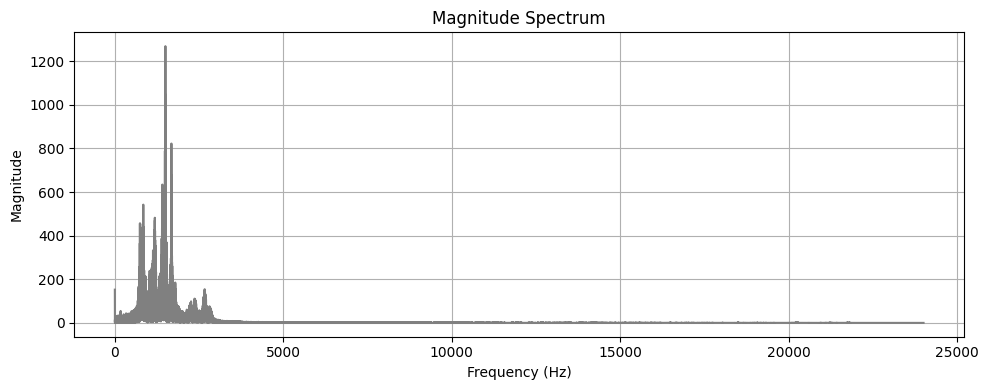

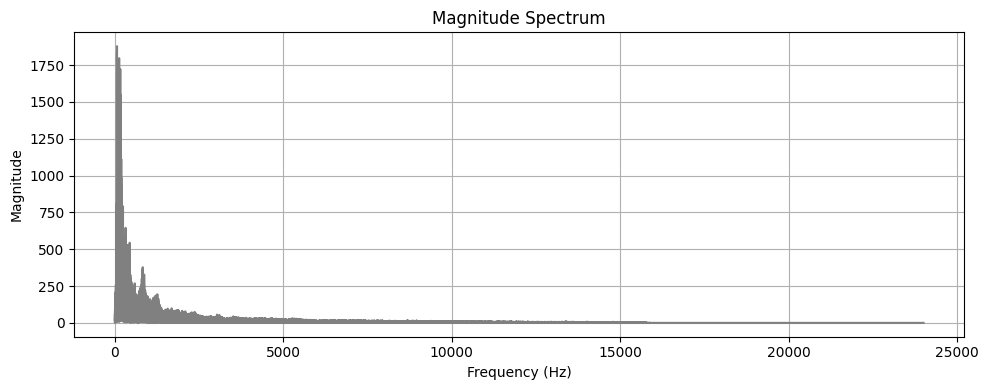

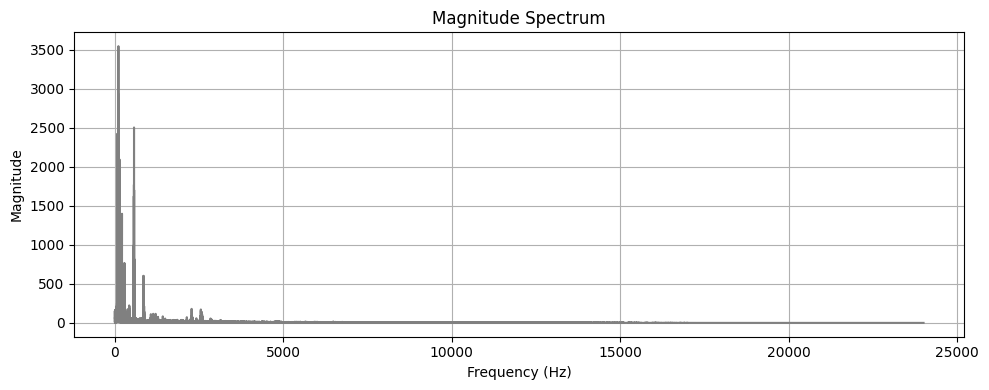

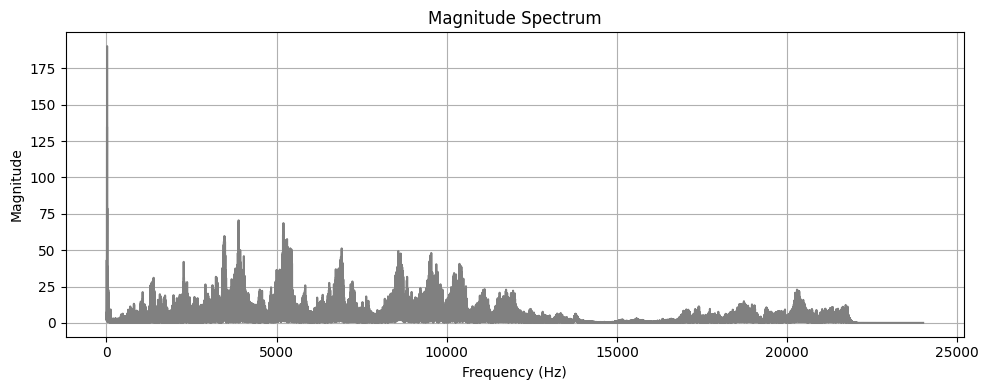

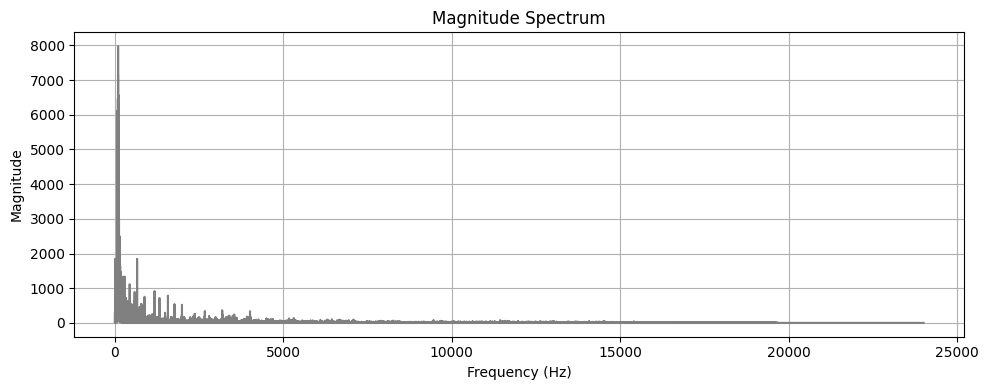

In [ ]:
def solve(audio_data):
  ft = np.fft.fft(audio_data)
  magnitude = np.abs(ft)
  frequency = np.fft.fftfreq(len(ft), d=1/sample_rate)
  half_range = len(frequency) // 2
  frequency = frequency[:half_range]
  magnitude = magnitude[:half_range]

  plt.figure(figsize=(10, 4))
  plt.plot(frequency, magnitude, color='grey')
  plt.title("Magnitude Spectrum")
  plt.xlabel("Frequency (Hz)")
  plt.ylabel("Magnitude")
  plt.grid()
  plt.tight_layout()
  plt.show()
for audio_data in audio_list:
  solve(audio_data)

4) Compute and visualize the STFT for the audio signal using scipy.signal.stft.

Experiment with different window sizes (e.g., 256, 1024, 4096).
Discuss the trade-off between time and frequency resolution.

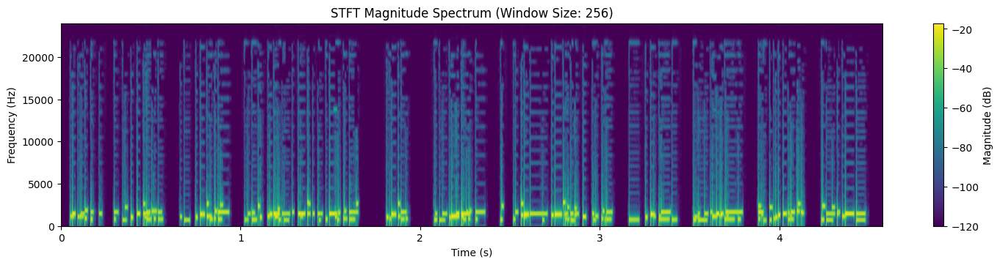

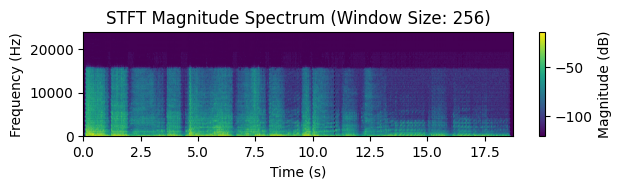

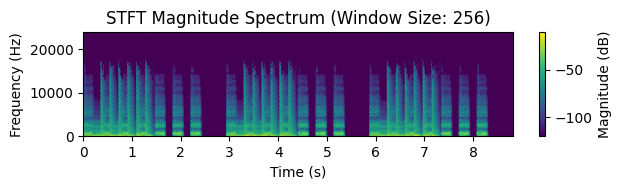

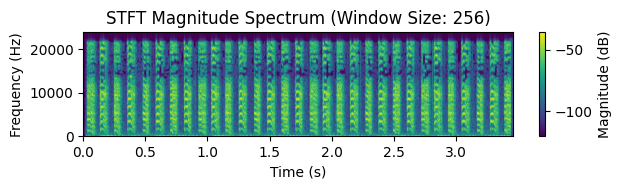

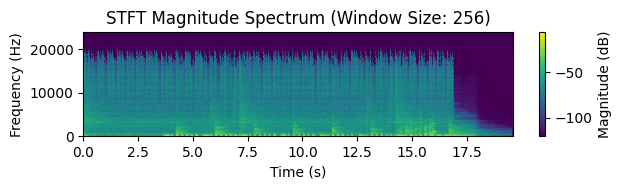

...

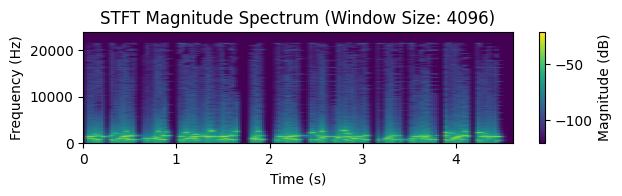

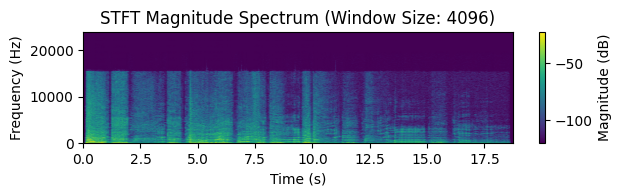

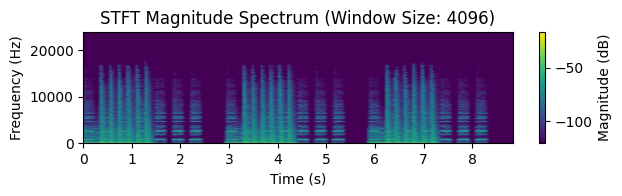

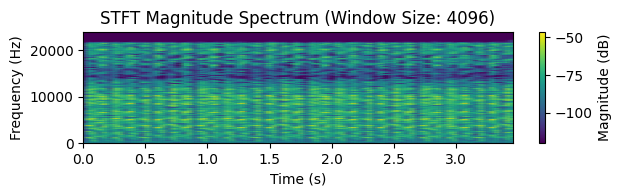

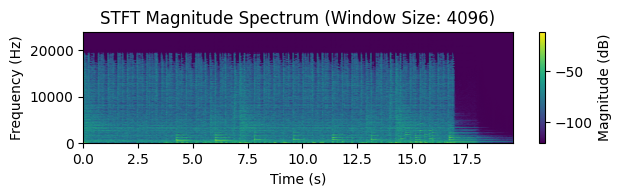

In [ ]:
from scipy.signal import stft
window_sizes = [256, 1024, 4096]

plt.figure(figsize=(15, 10))
for i, win_size in enumerate(window_sizes):
    for audio_data in audio_list:
      f, t, Zxx = stft(audio_data, fs=sample_rate, nperseg=win_size)
      magnitude = np.abs(Zxx)

      plt.subplot(3, 1, i + 1)
      plt.pcolormesh(t, f, 20 * np.log10(magnitude + 1e-6), shading='gouraud', cmap='viridis')
      plt.title(f"STFT Magnitude Spectrum (Window Size: {win_size})")
      plt.ylabel("Frequency (Hz)")
      plt.xlabel("Time (s)")
      plt.colorbar(label="Magnitude (dB)")
      plt.tight_layout()
      plt.show()

# Spectrogram Visualization

1) Create spectrogram for the audio files uploaded  using librosa.display.specshow.

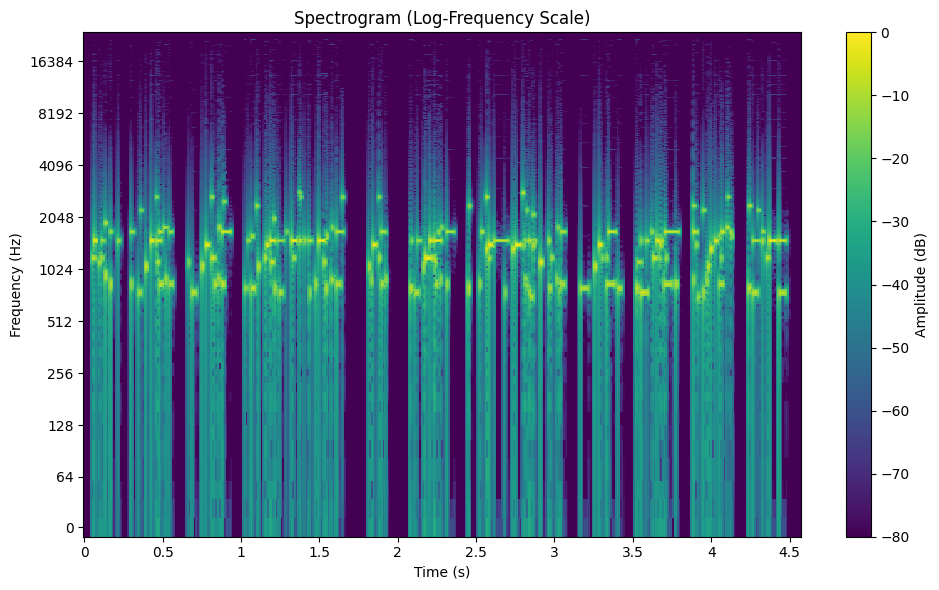

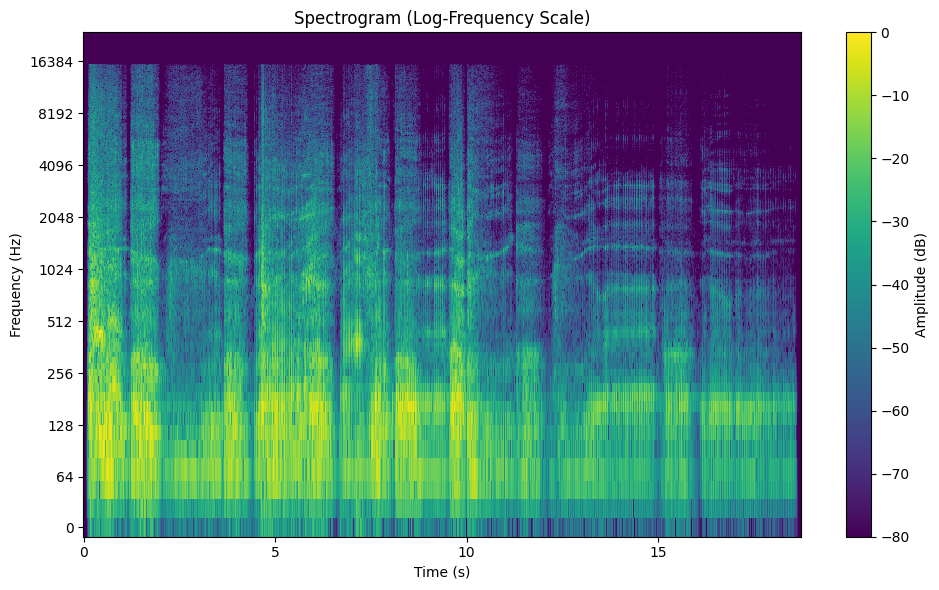

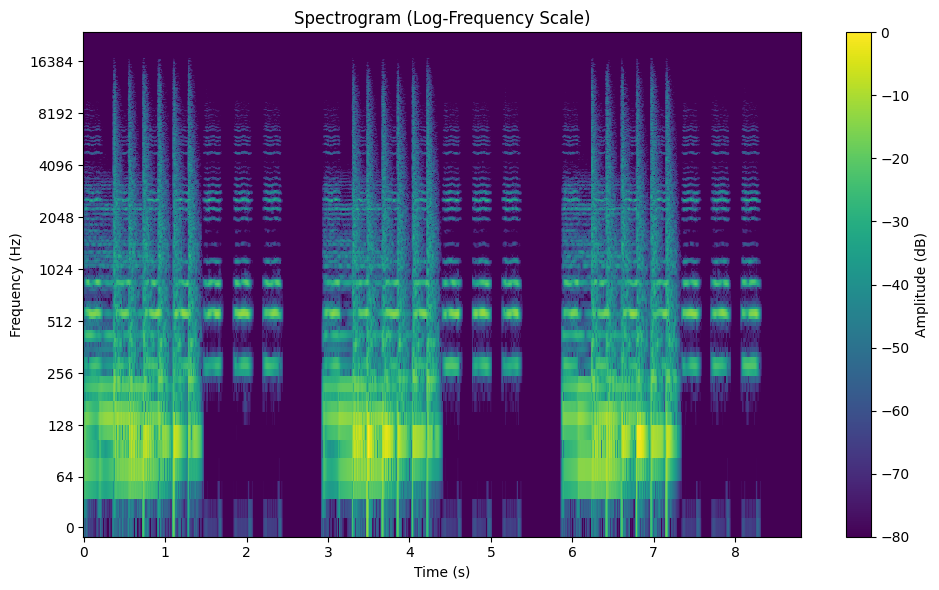

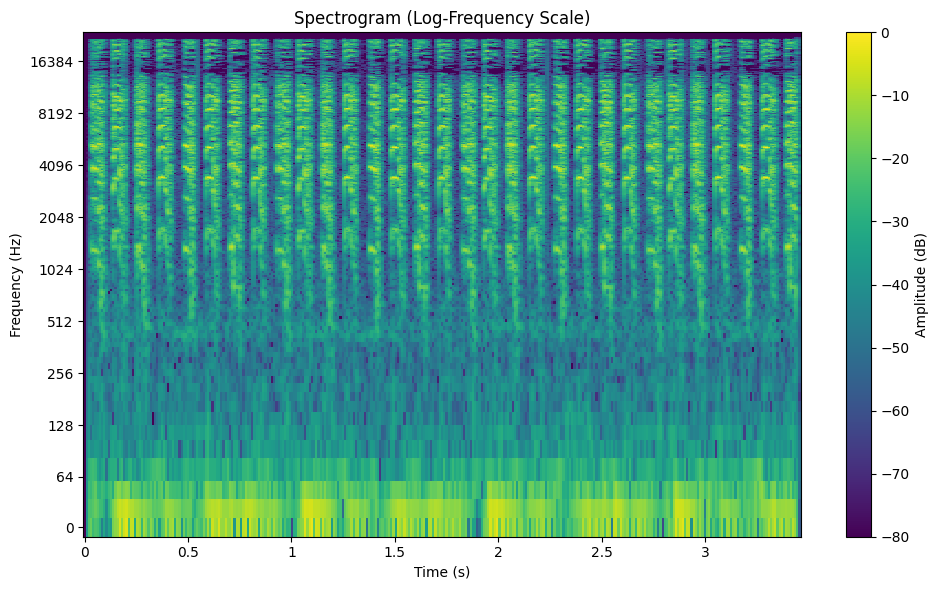

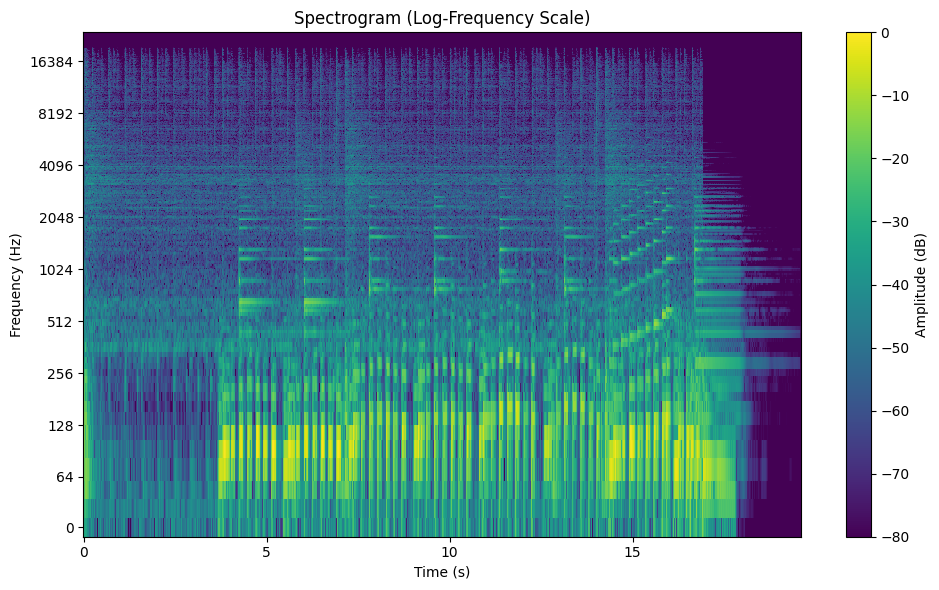

In [ ]:
for audio_data in audio_list:
  stft_result = librosa.stft(audio_data)
  magnitude_spectrogram = librosa.amplitude_to_db(abs(stft_result), ref=np.max)

  plt.figure(figsize=(10, 6))
  librosa.display.specshow(magnitude_spectrogram, sr=sample_rate, x_axis="time", y_axis="log", cmap="viridis")
  plt.colorbar(label="Amplitude (dB)")
  plt.title("Spectrogram (Log-Frequency Scale)")
  plt.xlabel("Time (s)")
  plt.ylabel("Frequency (Hz)")
  plt.tight_layout()
  plt.show()

2) Experiment with
logarithmic scaling for frequency and
different color maps for better visualization.

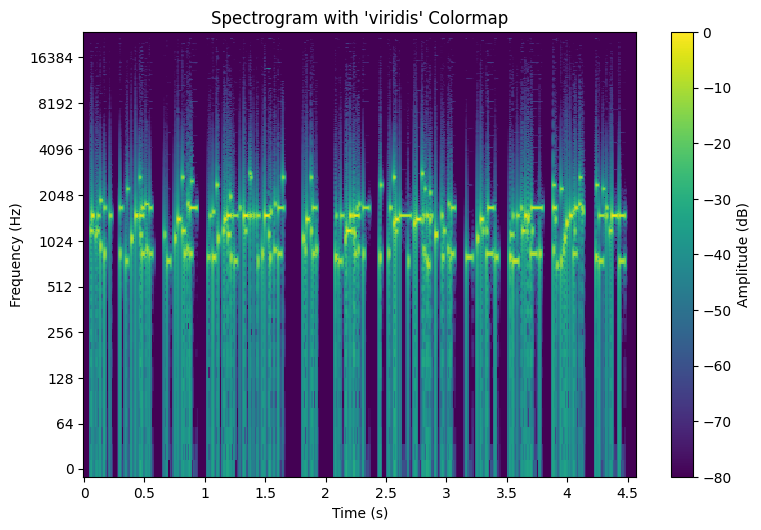

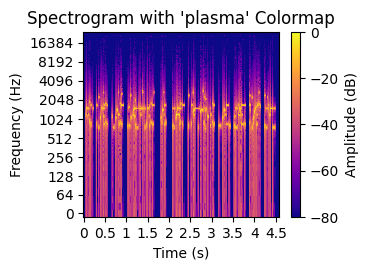

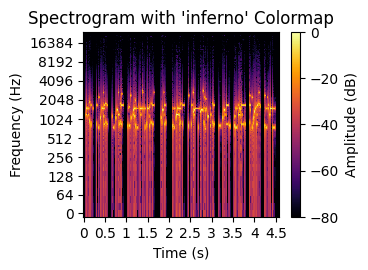

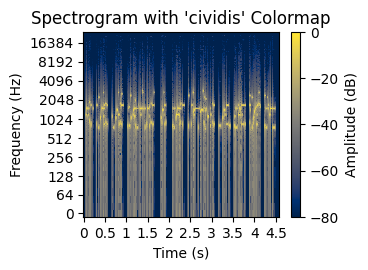

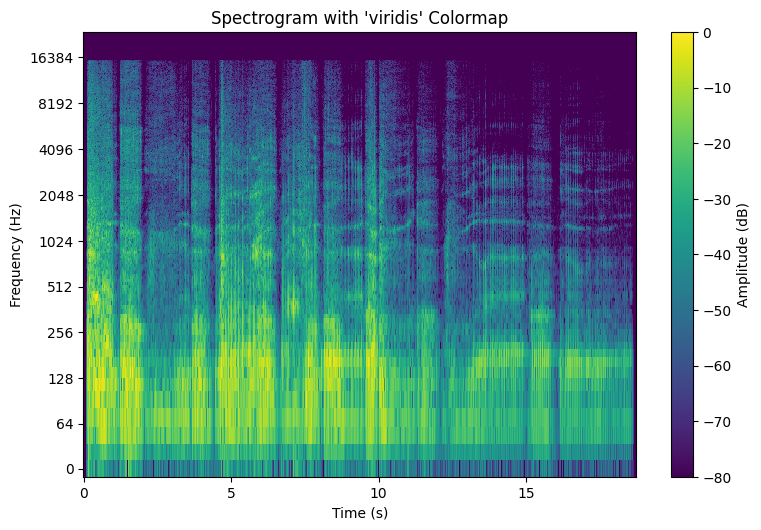

...

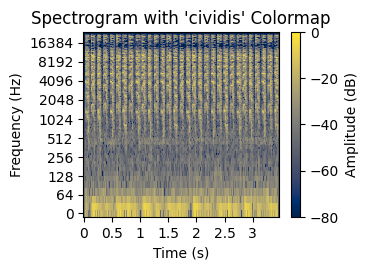

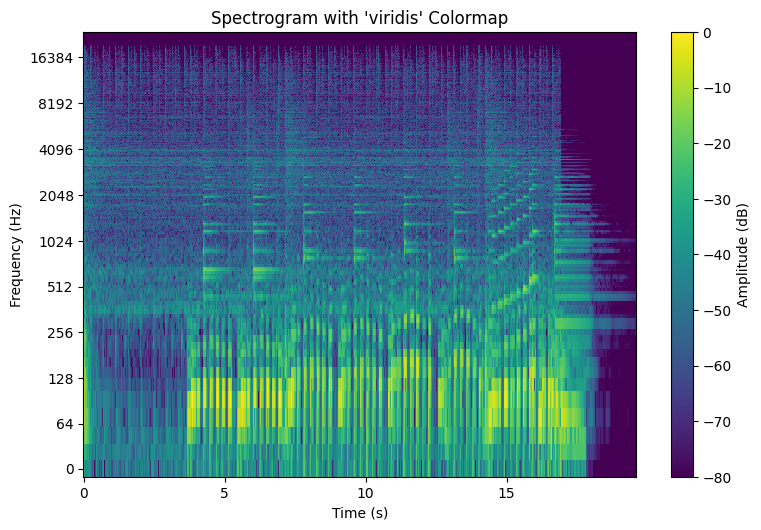

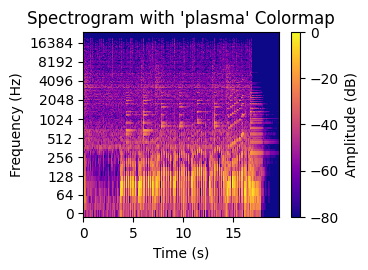

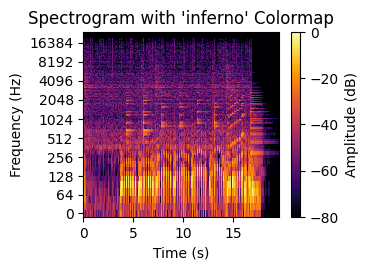

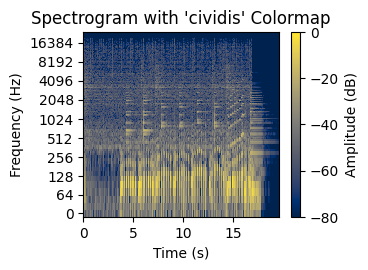

In [ ]:
for audio_data in audio_list:

  stft_result = librosa.stft(audio_data)
  magnitude_spectrogram = librosa.amplitude_to_db(abs(stft_result), ref=np.max)
  colormaps = ["viridis", "plasma", "inferno", "cividis"]

  plt.figure(figsize=(15, 10))

  for i, cmap in enumerate(colormaps):
    plt.subplot(2, 2, i + 1)
    librosa.display.specshow(
        magnitude_spectrogram,
        sr=sample_rate,
        x_axis="time",
        y_axis="log",
        cmap=cmap,
    )
    plt.colorbar(label="Amplitude (dB)")
    plt.title(f"Spectrogram with '{cmap}' Colormap")
    plt.xlabel("Time (s)")
    plt.ylabel("Frequency (Hz)")
    plt.tight_layout()
    plt.show()

3) Discuss how the spectrogram helps visualize frequency changes over time.

In [ ]:
#A spectrogram is a visual representation of the spectrum of frequencies of a signal as it varies with time as usual.
#It represents a signal's frequency spectrum as a function of time, showing both the frequency and amplitude (or power) of the signal at each point in time.
#for composite signals ,the spectrogram shows how different frequency components interact over time, helping identify patterns, noise, or changes in the signal's characteristics.

# Quantization

1) Simulate a 50 Hz sine wave sampled at 1000 Hz.

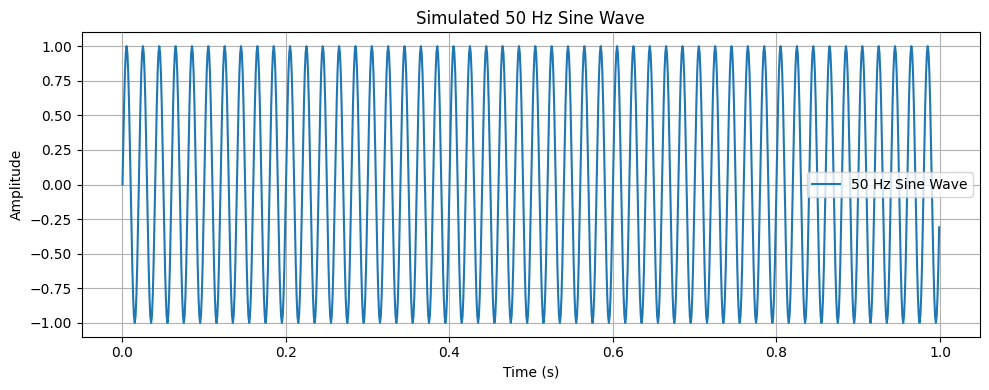

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

frequency = 50
sampling_rate = 1000
duration = 1

t = np.linspace(0, duration, int(sampling_rate * duration), endpoint=False)

sine_wave = np.sin(2 * np.pi * frequency * t)

plt.figure(figsize=(10, 4))
plt.plot(t, sine_wave, label=f"{frequency} Hz Sine Wave")
plt.title("Simulated 50 Hz Sine Wave")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()


2) Quantize the signal with different bit depths (e.g., 8-bit, 4-bit).

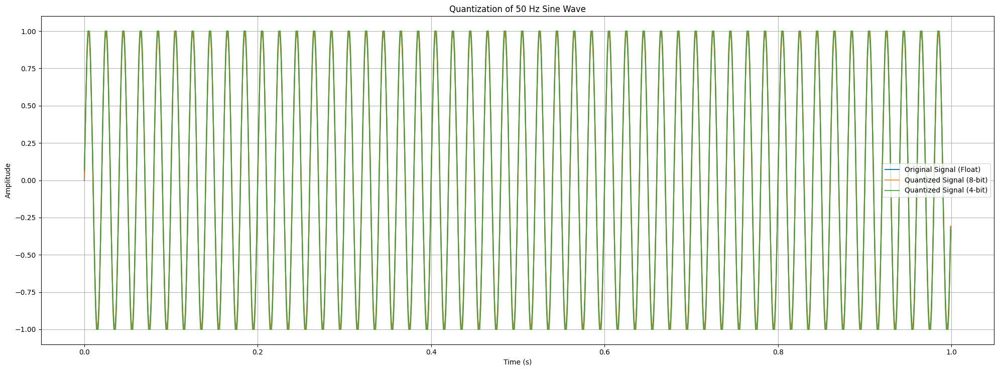

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def quantize_signal(signal, bit_depth):
    """Quantize the signal to the specified bit depth."""
    levels = 2 ** bit_depth
    signal_min = np.min(signal)
    signal_max = np.max(signal)

    normalized_signal = (signal - signal_min) / (signal_max - signal_min)

    quantized_signal = np.round(normalized_signal * (levels - 1)) / (levels - 1)

    quantized_signal = quantized_signal * (signal_max - signal_min) + signal_min

    return quantized_signal

frequency = 50
sampling_rate = 1000
duration = 1

t = np.linspace(0, duration, int(sampling_rate * duration), endpoint=False)

sine_wave = np.sin(2 * np.pi * frequency * t)

bit_depths = [8, 4]
quantized_signals = {bd: quantize_signal(sine_wave, bd) for bd in bit_depths}

plt.figure(figsize=(20, 7.5))

plt.plot(t, sine_wave, label="Original Signal (Float)", linewidth=1.5)

for bd in bit_depths:
    plt.plot(t, quantized_signals[bd], label=f"Quantized Signal ({bd}-bit)", alpha=0.8)

plt.title("Quantization of 50 Hz Sine Wave")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


3) Plot and compare
the original signal and the
quantized signals for each bit depth.

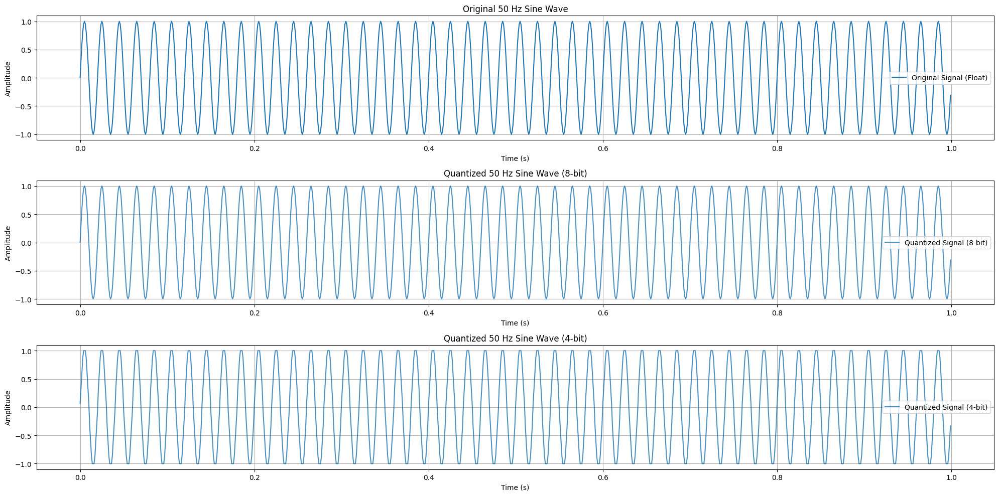

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def quantize(signal, bit_depth):
    levels = 2 ** bit_depth
    signal_min = np.min(signal)
    signal_max = np.max(signal)

    normalized_signal = (signal - signal_min) / (signal_max - signal_min)

    quantized_signal = np.round(normalized_signal * (levels - 1)) / (levels - 1)

    quantized_signal = quantized_signal * (signal_max - signal_min) + signal_min

    return quantized_signal

frequency = 50
sampling_rate = 1000
duration = 1

t = np.linspace(0, duration, int(sampling_rate * duration), endpoint=False)

sine_wave = np.sin(2 * np.pi * frequency * t)

bit_depths = [8, 4]
quantized_signals = {bd: quantize(sine_wave, bd) for bd in bit_depths}

plt.figure(figsize=(20, 10))

plt.subplot(3, 1, 1)
plt.plot(t, sine_wave, label="Original Signal (Float)", linewidth=1.5)
plt.title("Original 50 Hz Sine Wave")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid()
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(t, quantized_signals[8], label="Quantized Signal (8-bit)", alpha=0.8)
plt.title("Quantized 50 Hz Sine Wave (8-bit)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid()
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(t, quantized_signals[4], label="Quantized Signal (4-bit)", alpha=0.8)
plt.title("Quantized 50 Hz Sine Wave (4-bit)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()
